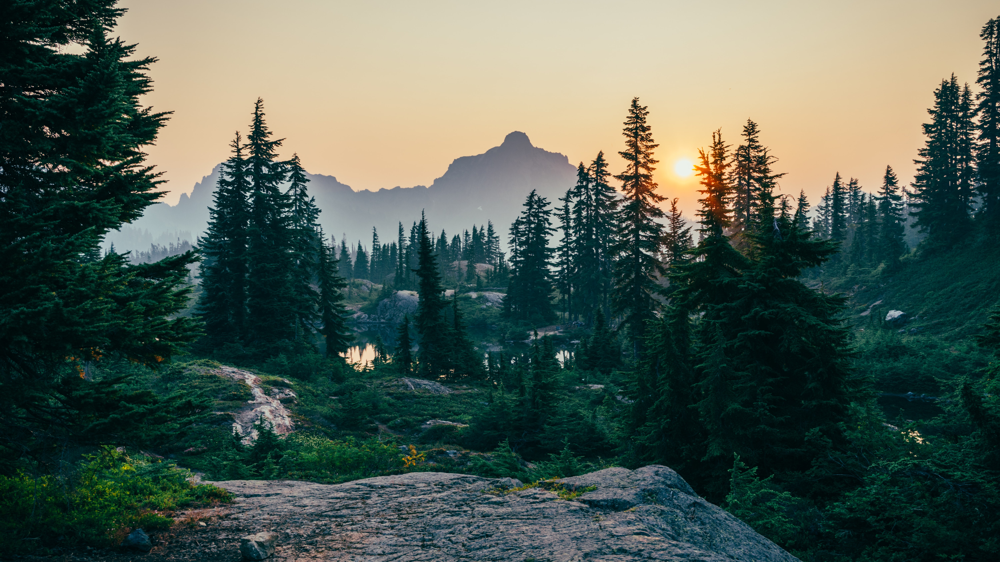

# Group A - Forest Cover Prediction

- Jose Ignacio Orlandi. 
- Felipe Echeverri 
- Jesus Mier Prado
- Mukhtadir Syed
- Zhizheng Wang

# Sections 
* [1. Set up](#1)
* [2. Data Load](#2)
* [3. Missing Values](#3)
* [4. EDA - Univariate](#4)
  * [4.1 Understanding the dataset](#4.1)
  * [4.2 Identify Outliers](#4.2)
   * [4.2.1 Slope](#4.2.1)
   * [4.2.2 Horizontal_Distance_To_Hydrology](#4.2.2)
   * [4.2.3 Vertical_Distance_To_Hydrology](#4.2.3)
   * [4.2.4 Horizontal_Distance_To_Roadways](#4.2.4)
   * [4.2.5 Hillshade_9am](#4.2.5)
   * [4.2.6 Hillshade_Noon](#4.2.6)
   * [4.2.7 Hillshade_3pm](#4.2.7)
   * [4.2.8 Horizontal_Distance_To_Fire_Points](#4.2.8)
  * [4.3 Dummy variables analysis](#4.3)
   * [4.3.1 Soil_Type](#4.3.1)
   * [4.3.2 Wilderness_Area](#4.3.2)
  * [4.4 Cover_Type analysis](#4.4) 
* [5. EDA - Multivariate](#5)
  * [5.1 Correlation](#5.1)
  * [5.2 Pairplot](#5.2)
  * [5.3 Adding new features](#5.3)
  * [5.4 Cover_Type1 and Cover_Type2 after feature engineering](#5.4)
* [6. Predictive Modelling](#6)
  * [6.1 Random Forest](#6.1)
* [7. Submission](#7)
  * [7.1 Load the test data](#7.1)
  * [7.2 Quick treatment of the test dataset](#7.2)
  * [7.3 Data Preprocessing](#7.3)
  * [7.4 Fit with all training dataset](#7.4)
  * [7.5 Make predict](#7.5)
  * [7.6 Output the result](#7.6)
* [8. Conclusions](#8)

# 1. Set up <a name=1></a>

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import math
from sklearn.metrics import confusion_matrix
from sklearn import metrics 
from sklearn.metrics import classification_report
from matplotlib.pyplot import figure
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import confusion_matrix

#In order to be able to see all the columns of our dataframes:
pd.options.display.max_columns = None

## 2. Data Load <a name=2></a>

In [3]:
df = pd.read_csv("train.csv")
dfcopy= pd.read_csv("train.csv")

In [4]:
dfcopy.shape

(15120, 56)

In [5]:
df.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


# 3. Missing Values <a name=3></a>

Our dataset does not present any missing values.

In [6]:
null_check = df.isnull().sum()
for key in null_check.keys():
    if null_check[key] != 0:
        print(key)

# 4. EDA - Univariate <a name=4></a>

### 4.1 Understanding the dataset <a name=4.1></a>

In [7]:
# Since aspect is the degree the surface if facing, 0 and 360 are meaning the same
df = df.replace({'Aspect': {360: 0}})

### 4.2 Identify Outliers <a name=4.2></a>

In [8]:
outlier_check = df[df.columns[:10]]
outlier_check.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm
0,1,2596,51,3,258,0,510,221,232,148
1,2,2590,56,2,212,-6,390,220,235,151
2,3,2804,139,9,268,65,3180,234,238,135
3,4,2785,155,18,242,118,3090,238,238,122
4,5,2595,45,2,153,-1,391,220,234,150


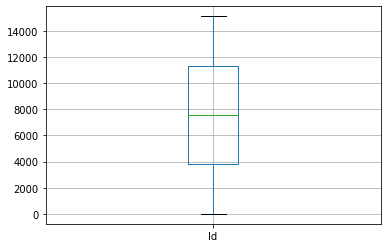

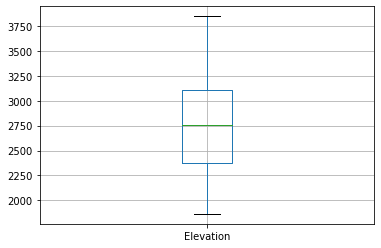

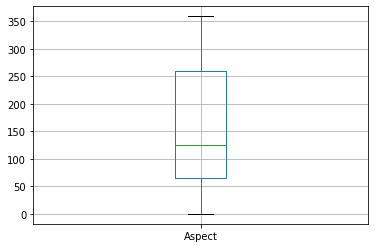

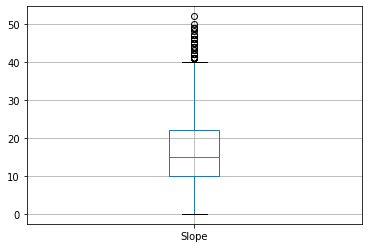

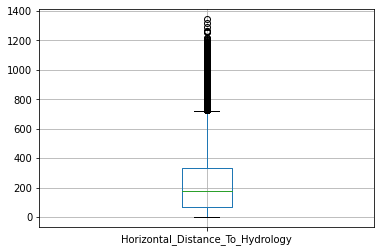

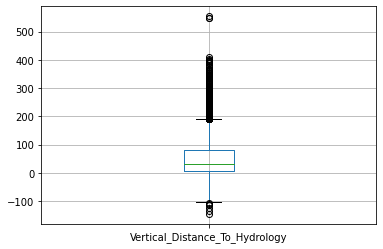

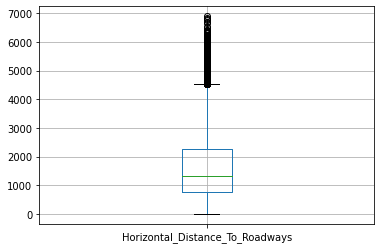

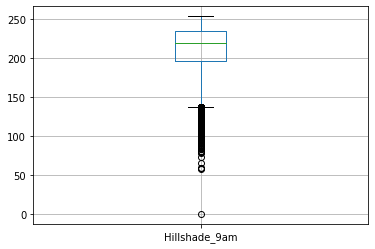

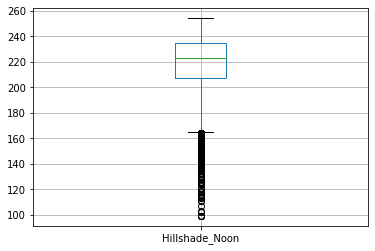

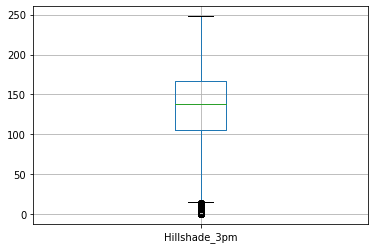

In [9]:
for column in outlier_check:
    plt.figure()
    outlier_check.boxplot([column])

It seems there are some columns that might have outliers, so we will drill into each of the following columns for details.

##### 4.2.1 Slope <a name=4.2.1></a>

In [10]:
slope = df['Slope']
slope.describe()

count    15120.000000
mean        16.501587
std          8.453927
min          0.000000
25%         10.000000
50%         15.000000
75%         22.000000
max         52.000000
Name: Slope, dtype: float64

In [11]:
fig = px.histogram(slope, x="Slope", marginal="box")
fig.show()

Since it logically makes sense to have some of the area with slope up to 52, we consider no outliers in this variable. 

##### 4.2.2 Horizontal_Distance_To_Hydrology <a name=4.2.2></a>

In [12]:
hdistance_to_hydroplogy = df['Horizontal_Distance_To_Hydrology']
hdistance_to_hydroplogy.describe()

count    15120.000000
mean       227.195701
std        210.075296
min          0.000000
25%         67.000000
50%        180.000000
75%        330.000000
max       1343.000000
Name: Horizontal_Distance_To_Hydrology, dtype: float64

In [13]:
fig = px.histogram(hdistance_to_hydroplogy, x="Horizontal_Distance_To_Hydrology", marginal="box")
fig.show()

In [14]:
df[df.Horizontal_Distance_To_Hydrology > 1250]

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
7858,7859,3163,103,5,1260,294,2962,229,233,138,1768,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2
7892,7893,3108,65,14,1343,194,3001,233,210,106,1359,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2
9565,9566,3306,351,14,1261,289,1976,195,216,159,1945,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,7
9566,9567,3307,345,15,1260,290,1953,190,216,164,1954,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,7
9818,9819,3446,230,12,1261,321,4076,201,251,186,2731,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,7
9849,9850,3396,256,20,1294,163,3778,169,248,214,2656,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,7
13946,13947,3095,52,16,1318,226,2911,227,203,105,1328,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2


Although there are some values out of bounds, they mostly belong to classes 2 and 7, which is possible since maybe those classes are just higher than the average. Also, there are only 7 records of them. Hence, we choose to keep them without any further treatment.

##### 4.2.3 Vertical_Distance_To_Hydrology <a name=4.2.3></a>

In [15]:
vdistance_to_hydroplogy = df['Vertical_Distance_To_Hydrology']
vdistance_to_hydroplogy.describe()

count    15120.000000
mean        51.076521
std         61.239406
min       -146.000000
25%          5.000000
50%         32.000000
75%         79.000000
max        554.000000
Name: Vertical_Distance_To_Hydrology, dtype: float64

In [16]:
fig = px.histogram(vdistance_to_hydroplogy, x="Vertical_Distance_To_Hydrology", marginal="box")
fig.show()

In [17]:
df[df.Vertical_Distance_To_Hydrology > 500]

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
1803,1804,2931,283,26,778,554,854,138,230,227,2642,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,2
1892,1893,2922,272,31,799,547,875,123,231,238,2136,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2
11938,11939,2924,272,32,816,547,886,122,231,238,2554,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,2


In [18]:
vdh_class2 = df[df['Cover_Type'] == 2]
print(vdh_class2['Vertical_Distance_To_Hydrology'].describe())
fig = px.histogram(vdh_class2, x="Vertical_Distance_To_Hydrology", marginal="box")
fig.show()

count    2160.000000
mean       47.337963
std        59.137843
min      -146.000000
25%         9.000000
50%        31.000000
75%        68.000000
max       554.000000
Name: Vertical_Distance_To_Hydrology, dtype: float64


Initially, since there are few records that have a vertical distance too much away from the dataset, and since they all belong to the same class, we choose to impute them with the largest number of class 2 that is not trivially out of bound.

However, testing shows that with these outliers, the score will be better, as maybe they are helpful to distinguish this class. So eventually, we choose to keep them as is.

##### 4.2.4 Horizontal_Distance_To_Roadways <a name=4.2.4></a>

In [19]:
hdistance_to_roadways = df['Horizontal_Distance_To_Roadways']
hdistance_to_roadways.describe()

count    15120.000000
mean      1714.023214
std       1325.066358
min          0.000000
25%        764.000000
50%       1316.000000
75%       2270.000000
max       6890.000000
Name: Horizontal_Distance_To_Roadways, dtype: float64

In [20]:
fig = px.histogram(hdistance_to_roadways, x="Horizontal_Distance_To_Roadways", marginal="box")
fig.show()

Does not seems to have trivial outliers as the graph shows a continuous decay into these distances (they are not  points separated from the principal graph).

##### 4.2.5 Hillshade_9am <a name=4.2.5></a>

In [21]:
Hillshade_9am = df['Hillshade_9am']
Hillshade_9am.describe()

count    15120.000000
mean       212.704299
std         30.561287
min          0.000000
25%        196.000000
50%        220.000000
75%        235.000000
max        254.000000
Name: Hillshade_9am, dtype: float64

In [22]:
fig = px.histogram(Hillshade_9am, x="Hillshade_9am", marginal="box")
fig.show()

In [23]:
df[df['Hillshade_9am'] < 10]

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
2241,2242,2618,301,52,124,59,1789,0,157,231,1396,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6


Since zero shade for only one row does not make sense in reality and the rest of the columns seem acceptable, we choose to impute the number to the minimum value that is not out of bounds.

However, testing shows that we should keep the record as it is, so eventually, we just leave it.

##### 4.2.6 Hillshade_Noon <a name=4.2.6></a>

In [24]:
Hillshade_Noon = df['Hillshade_Noon']
Hillshade_Noon.describe()

count    15120.000000
mean       218.965608
std         22.801966
min         99.000000
25%        207.000000
50%        223.000000
75%        235.000000
max        254.000000
Name: Hillshade_Noon, dtype: float64

In [25]:
fig = px.histogram(Hillshade_Noon, x="Hillshade_Noon", marginal="box")
fig.show()

No outliers as they are part of a continuous increase in the graph and not separated bins that do not form part of the entire histogram.

##### 4.2.7 Hillshade_3pm <a name=4.2.7></a>

In [26]:
Hillshade_3pm = df['Hillshade_3pm']
Hillshade_3pm.describe()

count    15120.000000
mean       135.091997
std         45.895189
min          0.000000
25%        106.000000
50%        138.000000
75%        167.000000
max        248.000000
Name: Hillshade_3pm, dtype: float64

In [27]:
fig = px.histogram(Hillshade_3pm, x="Hillshade_3pm", marginal="box")
fig.show()

In [28]:
df[df['Hillshade_3pm'] == 0].groupby('Cover_Type').count()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
Cover_Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4
3,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13
4,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30,30
5,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23
7,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18,18


There are 89 rows of 0 here, which is possible that there is a region received no shade at all, so we keep all the records

##### 4.2.8 Horizontal_Distance_To_Fire_Points <a name=4.2.8></a>

In [29]:
Horizontal_Distance_To_Fire_Points = df['Horizontal_Distance_To_Fire_Points']
Horizontal_Distance_To_Fire_Points.describe()

count    15120.000000
mean      1511.147288
std       1099.936493
min          0.000000
25%        730.000000
50%       1256.000000
75%       1988.250000
max       6993.000000
Name: Horizontal_Distance_To_Fire_Points, dtype: float64

In [30]:
fig = px.histogram(Horizontal_Distance_To_Fire_Points, x="Horizontal_Distance_To_Fire_Points", marginal="box")
fig.show()

No outliers as they are not points separated from the graph. On the contrary, they are part of a continous increase. 

### 4.3 Dummy variables analysis <a name=4.3></a>

##### 4.3.1 Soil_Type <a name=4.3.1></a>

Later on, we will see that in the confusion matrix of our predictions, there are gonna be mainly two missclasifications:
- *Cover_Type1 with Cover_Type2*
- *Cover_Type3 with Cover_Type6*

In the below graph, we can see one of the reasons why this happens:

- Cover_Type1 and Cover_Type2 appears all the time togheter, for each Soil_Type, and usually with a similar amount of counts. This makes very difficult for the algorithm to be able to differentiate them.
- Something similar happens to Cover_Type3 and Cover_Type6, although mostly in Soil_Type10, where they are clearer the Cover_Types with the highest amount of counts.  

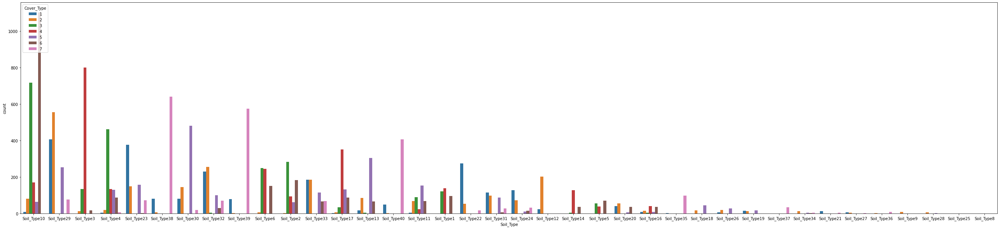

In [31]:
df_soil_type  = df[['Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5','Soil_Type7',
       'Soil_Type6', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11',
       'Soil_Type12', 'Soil_Type13', 'Soil_Type14','Soil_Type15', 'Soil_Type16',
       'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
       'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
       'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
       'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
       'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
       'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]

def get_dummies(row):
    for x in df_soil_type.columns:
        if row[x]==1:
            return x

df_soil_type = df_soil_type.apply(get_dummies, axis=1)
df_soil_type = df_soil_type.to_frame()
df_soil_type.rename({0: 'Soil_Type'}, axis='columns', inplace = True)
df_soil_type["Cover_Type"] = df["Cover_Type"]
df_soil_type = df_soil_type.sort_values(by = "Cover_Type")

plt.rc("figure", figsize=(45, 10))
sns.countplot(x="Soil_Type", hue="Cover_Type", data=df_soil_type, order = df_soil_type["Soil_Type"].value_counts().index)
plt.show()

##### 4.3.2 Wilderness_Area <a name=4.3.2></a>

Similarly to what happens with Cover_Type1 and Cover_Type2 in Soil_Type, in Wilderness_Area we see the same behaviour: the counts are very similar for each of them, making it very difficult for the algorithm to be able to differentiate them. 

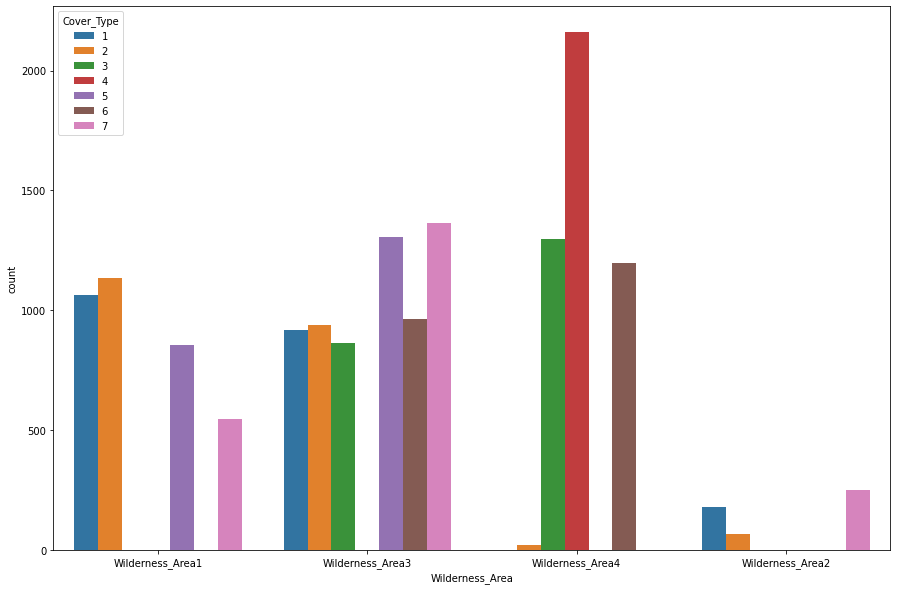

In [32]:
df_wilderness_area  = df[['Wilderness_Area1','Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4']]

def get_dummies(row):
    for x in df_wilderness_area.columns:
        if row[x]==1:
            return x

df_wilderness_area = df_wilderness_area.apply(get_dummies, axis=1)
df_wilderness_area = df_wilderness_area.to_frame()
df_wilderness_area.rename({0: 'Wilderness_Area'}, axis='columns', inplace = True)
df_wilderness_area["Cover_Type"] = df["Cover_Type"]

plt.rc("figure", figsize=(15, 10))
sns.countplot(x="Wilderness_Area", hue="Cover_Type", data=df_wilderness_area)
plt.show()

### 4.4 Cover_Type analysis <a name=4.4></a>

Some really good news! Our train dataset is completed balanced in the target variable, which will be very helpul when predicting it.

In [33]:
fig = px.histogram(df, x="Cover_Type", nbins=7)
fig.update_layout(bargap=0.2)
fig.show()

# 5. EDA - Multivariate <a name=5></a>

### 5.1 Correlation <a name=5.1></a>

In [34]:
corr_mat = df.corr(method='pearson')
sorted_mat = corr_mat.unstack().sort_values()

for i in sorted_mat.keys()[1::2]:
    if abs(sorted_mat[i]) > 0.5 and sorted_mat[i] != 1:
        print('Pair: ',i, " Correlation: ",sorted_mat[i])

Pair:  ('Wilderness_Area4', 'Elevation')  Correlation:  -0.7836510906630363
Pair:  ('Hillshade_9am', 'Hillshade_3pm')  Correlation:  -0.7799647424475467
Pair:  ('Hillshade_Noon', 'Slope')  Correlation:  -0.6126128724172818
Pair:  ('Aspect', 'Hillshade_9am')  Correlation:  -0.5933553864029582
Pair:  ('Wilderness_Area3', 'Wilderness_Area4')  Correlation:  -0.5691997405826235
Pair:  ('Wilderness_Area1', 'Soil_Type29')  Correlation:  0.5463093811359017
Pair:  ('Elevation', 'Horizontal_Distance_To_Roadways')  Correlation:  0.5786589907340086
Pair:  ('Hillshade_3pm', 'Hillshade_Noon')  Correlation:  0.6145263872475751
Pair:  ('Hillshade_3pm', 'Aspect')  Correlation:  0.6350767859101519
Pair:  ('Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Hydrology')  Correlation:  0.6521424712357421


### 5.2 Pairplot <a name=5.2></a>

In the univariate analysis, we found some interesting information regarding how similar is Cover_Type1 and Cover_Type2. This is something that, as previously mentioned, arises when we look at the confusion matrix of our predictive models: they find it very difficult to differentiate between these two classes. That is why we would like to see if this similarity is also present in the other variables that we have.

In the below graph, we can see that clearly, these two classes are very similar. If they were somehow differentiated, we should see two groups on any of the graphs (or densities that are not overlapped). Precisely, that does not happen.

Further on, we will see if any of the variables that we create will help to differentiate these two Cover_Types a bit more, using a very similar graph.

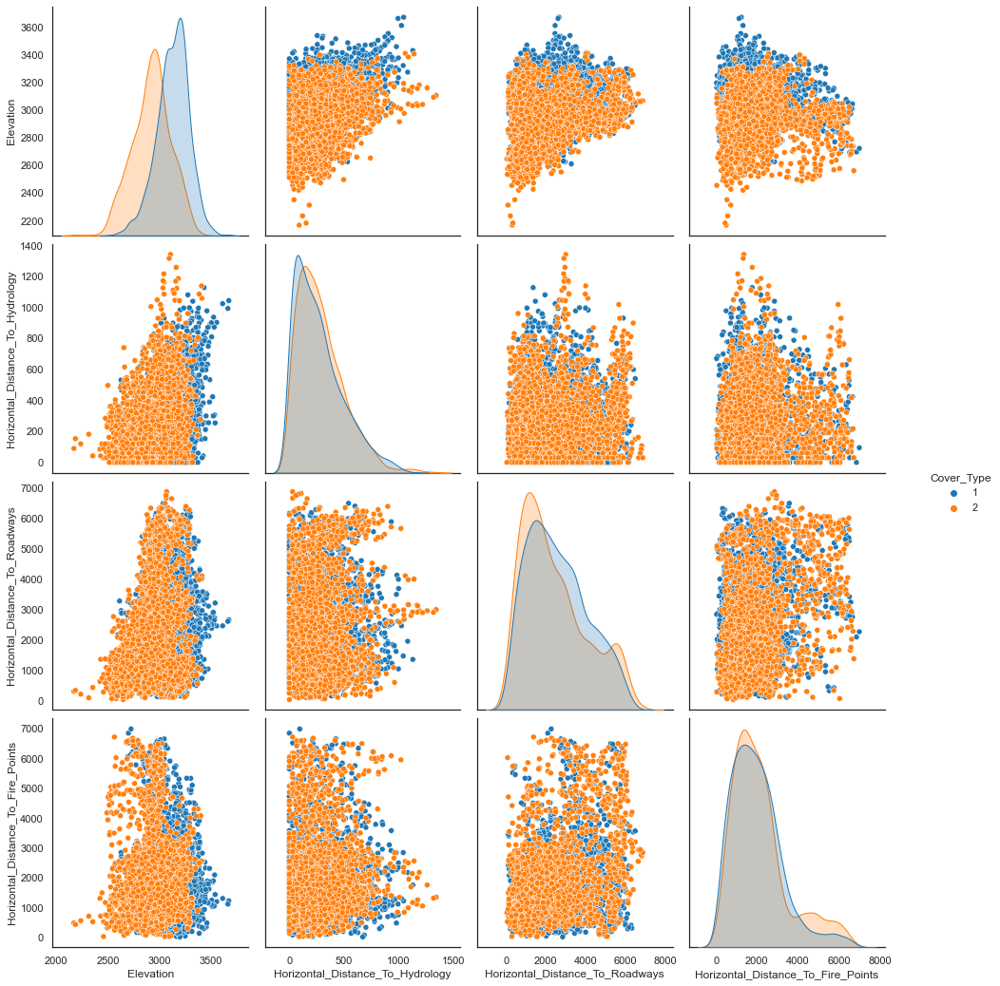

In [35]:
#Creation of an auxiliar DataFrame that only contains these two types of Cover_Type:
df_aux = df.loc[df["Cover_Type"] == 1]
df_aux = df_aux.append(df.loc[(df["Cover_Type"] == 2)])

#Creation of the pairplot for the rest of the variables apart from Soil_Type and Wilderness_Area:
sns.set_theme(style="ticks")
sns.set_theme(style="white")
fig = sns.pairplot(df_aux[['Elevation', 'Horizontal_Distance_To_Hydrology','Horizontal_Distance_To_Roadways', 'Horizontal_Distance_To_Fire_Points', "Cover_Type"]], hue="Cover_Type", palette="tab10")
fig.fig.set_size_inches(15,15)

### 5.3 Adding new features <a name=5.3></a>

In [36]:
df.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


In [37]:
df['Cover_Type'] = df['Cover_Type'].apply(str)

def data_preprocessing(df):

    #5.3.0 First Level column cleaning
    df = df.drop(['Soil_Type7','Soil_Type15'], axis=1)
    df = df[df.columns[1:]]
    df = df.replace({'Aspect': {360: 0}})
    
    #5.3.1 Seems the correlation between hillshades are high and logically slope would also be a concern, hence we created 
           #new columns for these attributes:
    df['Total_Hill'] = (df['Hillshade_9am'] + df['Hillshade_Noon'] + df['Hillshade_3pm']) * (1 - df['Slope']/90)
    df['Max_Hillshade'] = df[["Hillshade_9am", "Hillshade_9am",'Hillshade_3pm']].max(axis=1)
    df['Min_Hillshade'] = df[["Hillshade_9am", "Hillshade_9am",'Hillshade_3pm']].min(axis=1)

    #5.3.2  Horizontal_Distance_To_Hydrology and Vertical_Distance_To_Hydrology also have a pretty significant correlation, 
            #so we choose to calculate the absolute distance:
    df['Absolute_Distance_To_Hydrology'] = (df['Vertical_Distance_To_Hydrology']**2 + 
                                            df['Vertical_Distance_To_Hydrology']**2)**0.5

    #5.3.3 We find out some of the classes will represent over 50% of a certain soil type; hence, we choose to 
           #merge these soil type to make them type more significant:
    df['class_1_favored'] = df['Soil_Type21'] + df['Soil_Type22']
    df['class_2_favored'] = (df['Soil_Type8'] + df['Soil_Type9'] + df['Soil_Type12'] + df['Soil_Type25'] +
                             df['Soil_Type28'] + df['Soil_Type34'])
    df['class_4_favored'] = df['Soil_Type3'] + df['Soil_Type14'] + df['Soil_Type17']
    df['class_5_favored'] = df['Soil_Type13'] + df['Soil_Type18'] + df['Soil_Type26'] + df['Soil_Type30']
    df['class_7_favored'] = (df['Soil_Type35'] + df['Soil_Type36'] + df['Soil_Type37'] + 
                             df['Soil_Type38'] + df['Soil_Type39'] + df['Soil_Type40'])

    #5.3.4 Seems that elevation is different from class to class (hence a really good predictor), 
          #so we will put calculation for this column:
    df['Hydrology_Elevation_Sum'] = df['Elevation'] + df['Vertical_Distance_To_Hydrology']
    df['Hydrology_Elevation_Diff'] = df['Elevation'] - df['Vertical_Distance_To_Hydrology']
    df['Straignt_Distance_To_Ground_Level'] = df['Elevation'] / np.cos(math.pi*df['Slope']/180)

    #5.3.5 Further distance calculation becucase we find out it will impact the performance for changing them 
           #(these are the one that was helpful, we dropped those were not helping):
    df['Horizontal_Distance_Natural_Resource'] = (df['Horizontal_Distance_To_Hydrology'] + 
                                                  df['Horizontal_Distance_To_Fire_Points'] - 
                                                  df['Horizontal_Distance_To_Roadways'])
    df['Absolute_Vertiacal_Distance_To_Hydrology'] = abs(df['Vertical_Distance_To_Hydrology'])
    df['Horizontal_Distance_H_R'] = df['Horizontal_Distance_To_Hydrology'] - df['Horizontal_Distance_To_Roadways']
    df['Horizontal_Distance_R_F'] = df['Horizontal_Distance_To_Fire_Points'] - df['Horizontal_Distance_To_Roadways']

    #5.3.6 Aspect should be consider as categorical values, in our case, we separate them into 8 different class
    
    def aspect_group(x):
        if x > 315:
            result = 8
        elif x > 270:
            result = 7
        elif x > 225:
            result = 6
        elif x > 180:
            result = 5
        elif x > 135:
            result = 4
        elif x > 90:
            result = 3
        elif x > 45:
            result = 2
        else:
            result = 1
        return result
    
    df['Aspect_Group'] = df['Aspect'].apply(lambda x: aspect_group(x))
    pd.get_dummies(df,prefix='AspectGroup',columns=['Aspect_Group'], drop_first=False)

    #5.4 Drop columns we will not be used
    df = df.drop(['Vertical_Distance_To_Hydrology'], axis=1)
    df = df.drop(['Hillshade_9am'], axis=1)
    df = df.drop(['Hillshade_Noon'], axis=1)
    df = df.drop(['Hillshade_3pm'], axis=1)
    df = df.drop(['Slope'], axis=1)
    df = df.drop(['Aspect'], axis=1)
   
    return df

In [38]:
df = data_preprocessing(df)

Our final dataframe with all the variables that are gonna be used in our model:

In [39]:
df.head()

,Elevation,Horizontal_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type,Total_Hill,Max_Hillshade,Min_Hillshade,Absolute_Distance_To_Hydrology,class_1_favored,class_2_favored,class_4_favored,class_5_favored,class_7_favored,Hydrology_Elevation_Sum,Hydrology_Elevation_Diff,Straignt_Distance_To_Ground_Level,Horizontal_Distance_Natural_Resource,Absolute_Vertiacal_Distance_To_Hydrology,Horizontal_Distance_H_R,Horizontal_Distance_R_F,Aspect_Group
0,2596,258,510,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,580.966667,221,148,0.000000,0,0,0,0,0,2596,2596,2599.562610,6027,0,-252,5769,2
1,2590,212,390,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,592.533333,220,151,8.485281,0,0,0,0,0,2584,2596,2591.578720,6047,6,-178,5835,2
2,2804,268,3180,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,546.300000,234,135,91.923882,0,1,0,0,0,2869,2739,2838.952213,3209,65,-2912,2941,4
3,2785,242,3090,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,478.400000,238,122,166.877200,0,0,0,1,0,2903,2667,2928.322295,3363,118,-2848,3121,4
4,2595,153,391,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,590.577778,220,150,1.414214,0,0,0,0,0,2594,2596,2596.581767,5934,1,-238,5781,1


### 5.4 Cover_Type1 and Cover_Type2 after feature engineering <a name=5.4></a>

Unfortunately, after adding new variables, we don't see that any of them are actually able to properly differntiate these two classes. All the graphs presents some sort of overlapping.

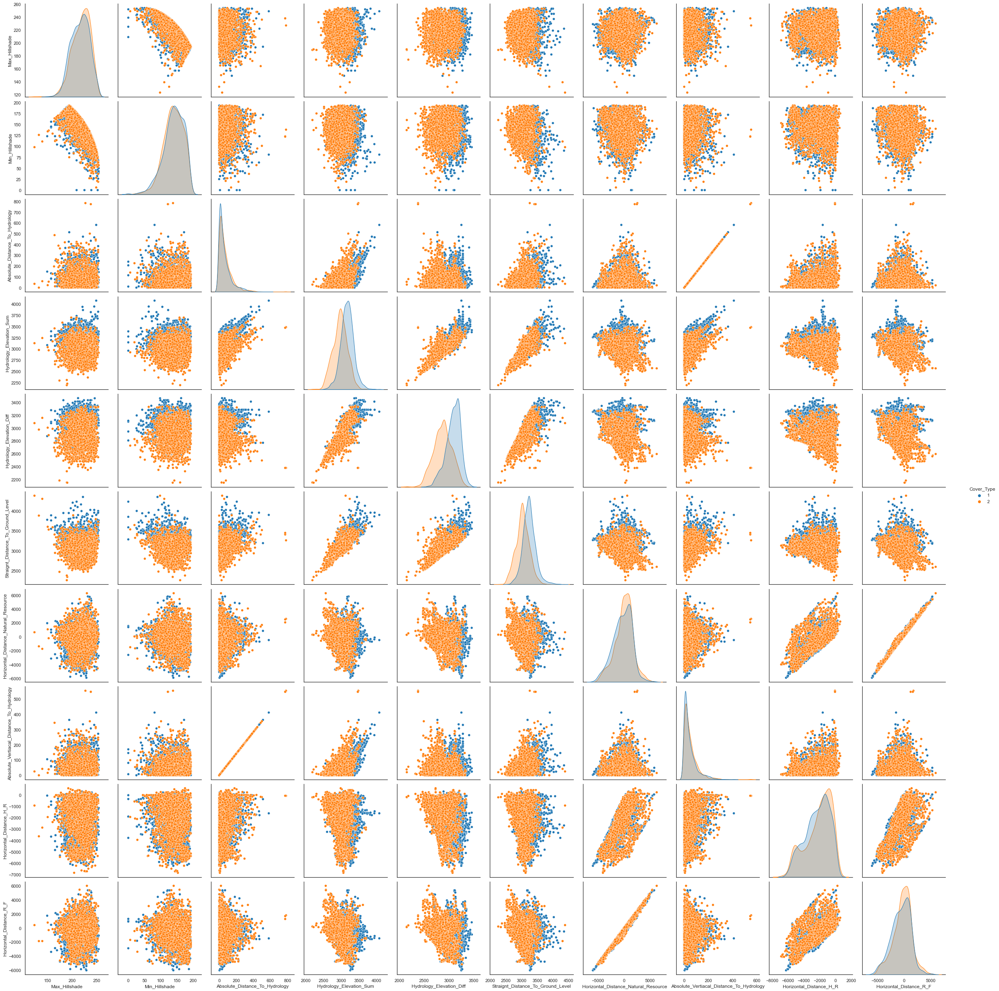

In [40]:
#Creation of an auxiliar DataFrame that only contains these two types of Cover_Type:
df_aux = df.loc[df["Cover_Type"] == "1"]
df_aux = df_aux.append(df.loc[(df["Cover_Type"] == "2")])

#Creation of the pairplot for the new numerical variables :
list_variables = ['Max_Hillshade', 'Min_Hillshade', 'Absolute_Distance_To_Hydrology', 'Hydrology_Elevation_Sum',
                  'Hydrology_Elevation_Diff', 'Straignt_Distance_To_Ground_Level','Horizontal_Distance_Natural_Resource',
                  'Absolute_Vertiacal_Distance_To_Hydrology', 'Horizontal_Distance_H_R',
                  'Horizontal_Distance_R_F','Cover_Type']
sns.set_theme(style="ticks")
sns.set_theme(style="white")
fig = sns.pairplot(df_aux[list_variables], hue="Cover_Type", palette="tab10")
fig.fig.set_size_inches(35,35)

With the below variables, we tried to identify those Soil_Types that clearly favored a particular class and stress them. Here we can see that the difference between these two Cover_Types now is better captured, altough the amount of cases that we are capturing is not high enough. Probably this will be helpful, but it is not gonna be the definitive solution.

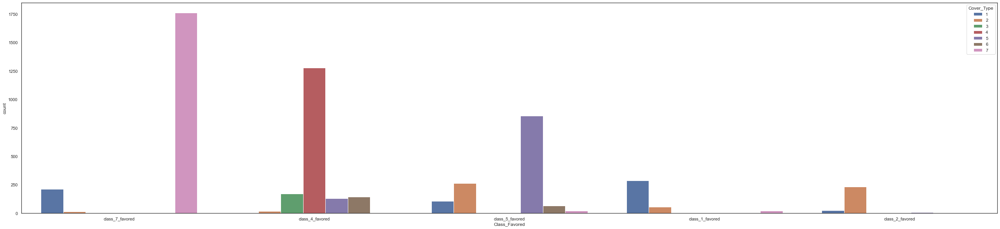

In [41]:
df_class_favored  = df[['class_1_favored', 'class_2_favored', 'class_4_favored','class_5_favored', 'class_7_favored']]

def get_dummies(row):
    for x in df_class_favored.columns:
        if row[x]==1:
            return x

df_class_favored = df_class_favored.apply(get_dummies, axis=1)
df_class_favored = df_class_favored.to_frame()
df_class_favored.rename({0: 'Class_Favored'}, axis='columns', inplace = True)
df_class_favored["Cover_Type"] = df["Cover_Type"]
df_class_favored = df_class_favored.sort_values(by = "Cover_Type")

plt.rc("figure", figsize=(45, 10))
sns.countplot(x="Class_Favored", hue="Cover_Type", data=df_class_favored, order = df_class_favored["Class_Favored"].value_counts().index)
plt.show()

### 5.5 Something we tried, but choose to not use due to worse performance

###### 5.5.1 Additional features to only distinguish class 1 and 2
We identified soil types that contain class 1 and 2, aggregate them into new columns when either class has higher percentage than the other. But the result gave lowered by 0.02, so we decided to not use it.

###### 5.5.2 Merger wilderarea with Soil Type
We consider to merge the wilder area and soil type by adding them together so that each of the new soil type column can be ranged from 0 to 2. We thought this would help us to locate more exactly to the specific region. However, the performance did not change at all.

###### 5.5.3 Data transformation

Since some of the the normal data distribution is skewed left/right, we considered to change it back to a standardized normal distrbution. However, the performance went worse. We suspect it is because the correlations between each columns are pretty low, tails of skewed distribution could in fact help us identify classes.

In stead, for hill shade, 2 of which have skewed distribution, we chose to merge the three as shown above.

###### 5.5.4 Data Scalling

It was not helpful at all, especially for class 1 and 2, which have high similarity, scalling caused the model not able to identify the two classes at all

###### 5.5.5 Pairwise distance

Even though some did help, we found almost no actual meaning by multiplying vertical distance to hydrology with horizontal distance to fireroad. Additionally, the performance increase was insiginicant. So we decided to not used these meaningless attributes

# 6. Predictive Modelling <a name=6></a>

In [42]:
X = df.drop(['Cover_Type'], axis=1) 
y = df['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.15, random_state = 5)

#### 6.1  ExtraTrees Classifier & Random Forest <a name=6.1></a>

We decide to use these two models as per our analysis and research, both of them appear to be the ones with the greatest results. In addition, they run quite faster in comparison with other models (such as XGBoost), which is an advantage when dealing with feature engineering.

In [43]:
grid = {"n_estimators": [10, 100, 500, 1000, 1200],
       "max_depth": [None, 5, 10, 20, 30],
       "max_features": ["auto", "sqrt"],
       "min_samples_split": [2,4,6],
       "min_samples_leaf": [1,2,4]}


# Training the model with Extra Trees:

model1 = ExtraTreesClassifier()

rs1_clf= RandomizedSearchCV(estimator=model1,
                          param_distributions=grid,
                          n_iter=20,
                          cv=5,
                          verbose=2)
rs1_clf.fit(X_train, y_train);


# Training the model with Random Forest:

model2 = RandomForestClassifier()

rs2_clf= RandomizedSearchCV(estimator=model2,
                          param_distributions=grid,
                          n_iter=20,
                          cv=5,
                          verbose=2)
rs2_clf.fit(X_train, y_train);





Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, n_estimators=1200; total time=   8.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, n_estimators=1200; total time=   8.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, n_estimators=1200; total time=   8.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, n_estimators=1200; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, n_estimators=1200; total time=   8.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=500; total time=   1.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, n_estimators=500; total time=   1.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, 

We can see that the score is just a little bit higher with Extra Tree Classifier than with Random Forest. Altough the difference is minimal, we must consider that our test set only contains 2268 rows, so when predicting with the kaggle dataset (500k rows), these difference will increase. 

In [44]:
print("The score with Extra Tree Classifier is: ", round(rs1_clf.score(X_test, y_test),4))
print("The score with Random Forest Classifier is: ", round(rs2_clf.score(X_test, y_test),4))

The score with Extra Tree Classifier is:  0.8876
The score with Random Forest Classifier is:  0.8823


Now let´s see the confusion matrix to understand where are we misclassifying for each model:

In [45]:
preds1 = rs1_clf.predict(X_test)
preds2 = rs2_clf.predict(X_test)

Extra Tree Classifier confusion matrix

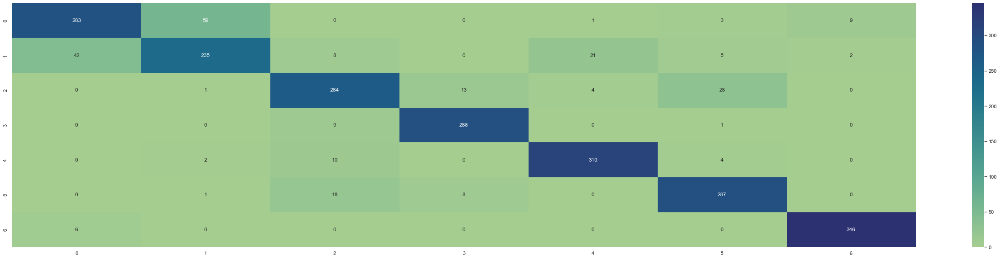

In [46]:
cm = confusion_matrix(y_test, preds1)
fig = sns.heatmap(cm, annot=True, fmt=".0f",cmap="crest");

Random Forest confusion matrix:

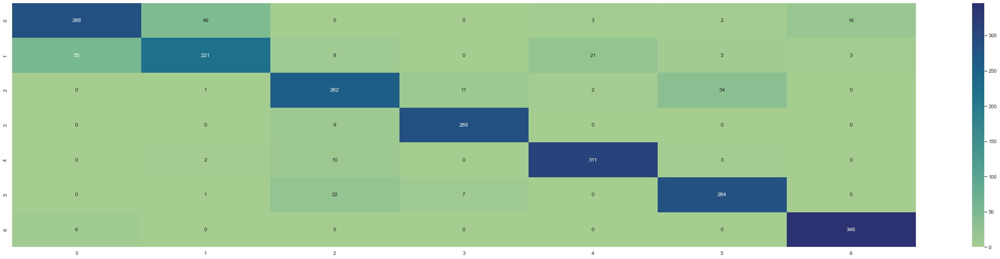

In [47]:
cm = confusion_matrix(y_test, preds2)
sns.heatmap(cm, annot=True, fmt=".0f",cmap="crest");

From the above graphs, we can identify some points:
- The model find it very difficult to differentiate Cover_Type1 from Cover_Type2 as we previously mentioned. If we could improve in this direction, we will see a good improvement in our score.
- Other area where the model find it difficult to differentiate, as previously mentioned, is between Cover_Type3 and Cover_Type6.

In addition to this, we can see why Extra Tree Classifier is better than Random Forest. Although the difference in the score appears to be minimal, the reality is that the first model is better when predicting mostly all the Cover_Types (except Cover_Type3 but the difference is low). As a result, we will use Extra Tree Classifier as our model when submitting the results in Kaggle.

Below we have the accuracy score for our winning model. We can clearly see what we appreciate in the confusion matrix: Cover_Type 4, 5 and 7 are clearly captured, while the rest ones are more difficult to differentiate (specially Cover_Type2).

In [48]:
#Accuracy statistics:

print('Accuracy Score:', metrics.accuracy_score(y_test, preds1))  

#Creation of the classification report:
class_report=classification_report(y_test, preds1)
print(class_report)

Accuracy Score: 0.8875661375661376
              precision    recall  f1-score   support

           1       0.85      0.80      0.83       355
           2       0.79      0.75      0.77       313
           3       0.85      0.85      0.85       310
           4       0.93      0.97      0.95       298
           5       0.92      0.95      0.94       326
           6       0.88      0.91      0.89       314
           7       0.97      0.98      0.98       352

    accuracy                           0.89      2268
   macro avg       0.89      0.89      0.89      2268
weighted avg       0.89      0.89      0.89      2268



When looking at the variable importance, we can see that our feature engineering process really helped the model when classifying, as many of the most important variables where not originally in the dataset. Also, the variables class_favored outperformed almost all the Soil_Types, which also appears to support our decision of making these new features.  

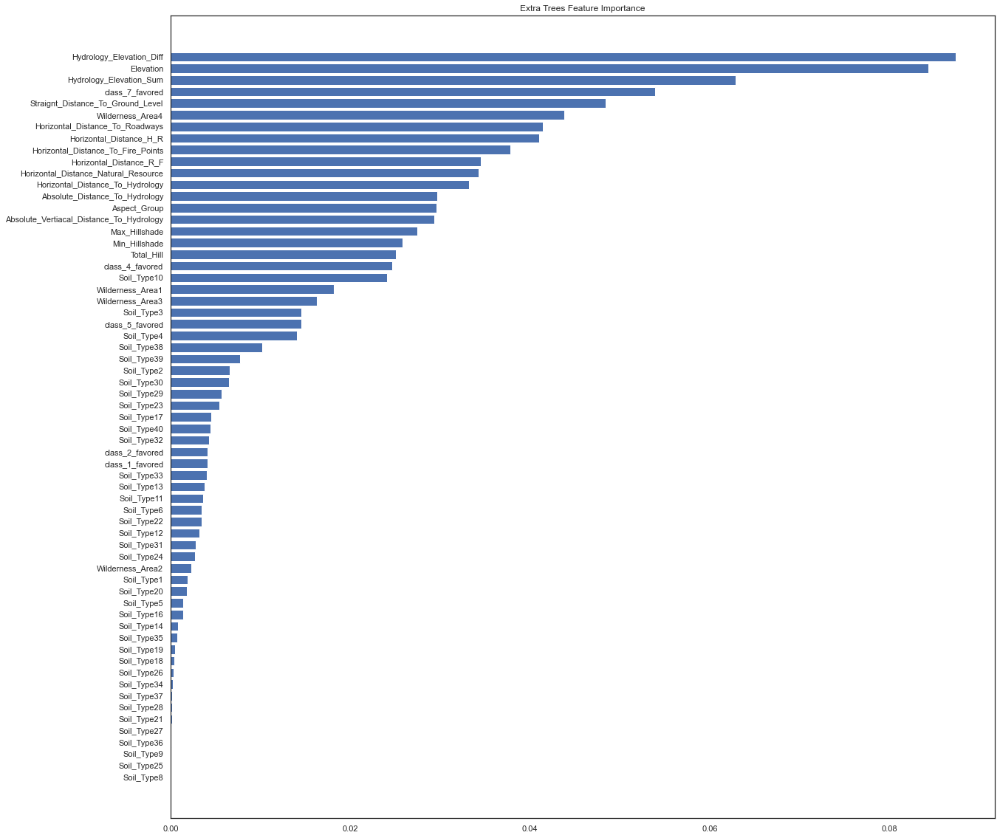

In [49]:
figure(figsize=(20, 20))
sorted_idx = rs1_clf.best_estimator_.feature_importances_.argsort()
plt.barh(X.columns[sorted_idx], rs1_clf.best_estimator_.feature_importances_[sorted_idx])
plt.title("Extra Trees Feature Importance");

# 7. Submission using Extra Trees Classifier <a name=7></a>

##### 7.1 Load the test data <a name=7.1></a>

In [50]:
test = pd.read_csv('test.csv')
test.copy= pd.read_csv('test.csv')
test.copy.shape

(565892, 55)

##### 7.2 Quick treatment of the test dataset <a name=7.2></a>

In [51]:
result = test[['Id']]

##### 7.3 Data Preprocessing <a name=7.3></a>

In [52]:
test = data_preprocessing(test)

##### 7.4 Fit with all training dataset <a name=7.4></a>

In [53]:
rs1_clf.fit(X, y);

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.7s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1200; total time=   2.9s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=1200; total time=   2.9s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_esti

In [54]:
# This is the one that can reproduce our final score
# ExtraTreesClassifier(max_depth=30, max_features='auto', n_estimators=1200)
rs1_clf.best_estimator_

ExtraTreesClassifier(max_depth=30, max_features='auto')

##### 7.5 Make predict <a name=7.5></a>

In [55]:
real_preds = rs1_clf.predict(test)

##### 7.6 Output the result <a name=7.6></a>

In [56]:
result['Cover_Type'] = real_preds

In [57]:
result.to_csv('result.csv',index=False)

## 8. Conclusions <a name=8></a>

We managed to have a score of 0.787 on Kaggle. When as we saw in the confusion matrix, our principal amount of errors come when confusing Cover_Type1 with Cover_Type2 (and vice versa) and Cover_Type3 with Cover_Type6. 

For future improvements for this prediction, we should try to find new solutions to these two problems (specially the first one) , as they correctness of the prediction of Cover_Type.

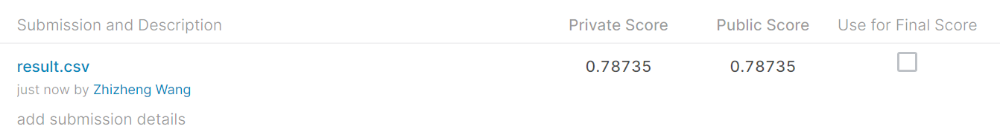

In [58]:
from IPython.display import Image
Image("FinalKaggleScore.png")